# Diamond price prediction

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px

In [2]:
data = pd.read_csv('diamonds.csv')
data.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [3]:
# drop 1st column 'Unnamed: 0' 
data.drop('Unnamed: 0',axis=1,inplace=True)  

## Manual analysis

In [4]:
data.to_excel('diamonds.xlsx')

### Column description

1. Carat: The weight of the diamond, measured in carats. Carat is often used as an indicator of a diamond's size.

2. Cut: Describes the quality of the diamond's cut, which determines how well it reflects and refracts light. The cut can be classified into several categories such as Fair, Good, Very Good, Premium, and Ideal.

3. Color: Represents the color grade of the diamond, ranging from 'D' (colorless) to 'Z' (light yellow or brown). The color grade indicates the presence of any noticeable color in the diamond.

4. Clarity: Indicates the level of internal and external flaws or inclusions within the diamond. The clarity grades range from 'IF' (internally flawless) to 'I3' (included), with higher grades indicating fewer flaws.

5. Depth: Refers to the depth of the diamond, calculated as the distance between the table and the culet, divided by the average width. It is represented as a percentage.

6. Table: Represents the width of the diamond's table (the flat facet on the top), divided by the average width. It is also expressed as a percentage.

7. Price: Denotes the price of the diamond in US dollars. This column indicates the cost of the diamond based on various factors such as carat weight, cut, color, clarity, etc.

8. x, y, z: These three columns provide the dimensions of the diamond in terms of length, width, and depth, respectively. These measurements are typically given in millimeters.

- These columns provide various attributes and characteristics of diamonds, which are commonly used to assess and determine their quality, value, and pricing.

## Issues with dataset

 - There are some duplicated values
 - outliers in column 'carat',

## Programatical analysis

In [5]:
df  = data.copy()

In [6]:
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [7]:
df.shape

(53940, 10)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [9]:
# missing values.
df.isnull().sum() 

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64

- There are no null values in dataset.

In [10]:
# duplicate entries
df.duplicated().sum()

146

- There are 146 duplicated rows in dataset , so we have drop that duplicated rows.

In [11]:
# remove duplicated rows
df.drop_duplicates(inplace=True)

# check again
df.duplicated().sum() 

0

In [12]:
df.shape 

(53794, 10)

In [13]:
# numerical columns 
df.describe()

,carat,depth,table,price,x,y,z
count,53794.00000,53794.000000,53794.000000,53794.000000,53794.000000,53794.000000,53794.000000
mean,0.79778,61.748080,57.458109,3933.065082,5.731214,5.734653,3.538714
std,0.47339,1.429909,2.233679,3988.114460,1.120695,1.141209,0.705037
min,0.20000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.40000,61.000000,56.000000,951.000000,4.710000,4.720000,2.910000
50%,0.70000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.04000,62.500000,59.000000,5326.750000,6.540000,6.540000,4.030000
max,5.01000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [14]:
# categorical columns
df.describe(include='O')

,cut,color,clarity
count,53794,53794,53794
unique,5,7,8
top,Ideal,G,SI1
freq,21488,11262,13032


# Exploratory Data Analysis

## 1. column types

In [15]:
num_cols = df.describe().columns
cat_cols = df.drop(columns=df.describe().columns, axis=1).columns

print('Numerical columns: ',num_cols)
print('Categorical columns: ',cat_cols)

Numerical columns:  Index(['carat', 'depth', 'table', 'price', 'x', 'y', 'z'], dtype='object')
Categorical columns:  Index(['cut', 'color', 'clarity'], dtype='object')


- Numerical : carat, depth, table, price, x, y, z
- categorical : cut, color, clarity

# 2. Univariate analysis 

### 1. carat column

In [16]:
# descriptive statistics
df['carat'].describe() 

count    53794.00000
mean         0.79778
std          0.47339
min          0.20000
25%          0.40000
50%          0.70000
75%          1.04000
max          5.01000
Name: carat, dtype: float64

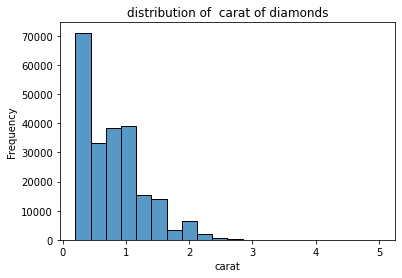

In [17]:
# histogram for carat column
sns.histplot(x=df['carat'],bins=20, stat='frequency')
plt.title('distribution of  carat of diamonds') 
plt.show()

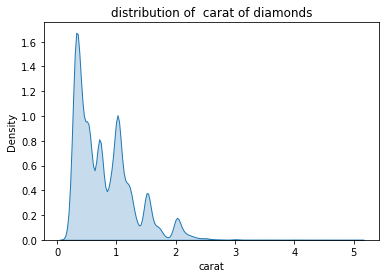

In [18]:
# kde plot for carat column
sns.kdeplot(x=df['carat'],fill=True,)
plt.title('distribution of  carat of diamonds') 
plt.show()

In [19]:
# skewness for  carat colum
df['carat'].skew() 

1.1136511411526497

- distribution of carat column is positively means right skewed.
- we will normalize it by using logarithm transformation.

<AxesSubplot:xlabel='carat'>

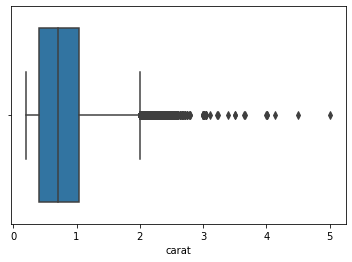

In [20]:
# box plot for 'carat' column
sns.boxplot(x=df['carat'])

- Outliers in carat column, we will remove them by IQR method

##  2. cut column

<AxesSubplot:xlabel='cut', ylabel='count'>

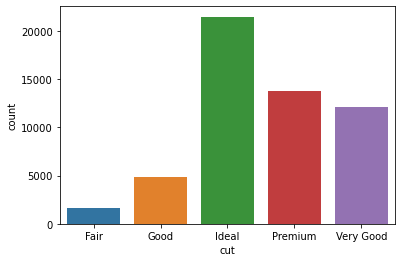

In [21]:
categories = sorted(df['cut'].unique())

sns.countplot(x=df['cut'], order=categories)

In [22]:
df['cut'].describe(include='O')

count     53794
unique        5
top       Ideal
freq      21488
Name: cut, dtype: object

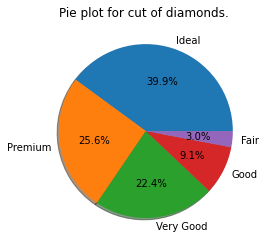

In [23]:
# pie chart for cut colum
labels = df['cut'].value_counts().index
plt.pie(df['cut'].value_counts(),labels=labels, autopct='%1.1f%%', shadow=True)
plt.title('Pie plot for cut of diamonds. ')
plt.show()

## 3. color 

In [24]:
color_counts = df['color'].value_counts()
color_counts

G    11262
E     9776
F     9520
H     8272
D     6755
I     5407
J     2802
Name: color, dtype: int64

In [25]:
fig = px.bar(df['color'].value_counts(), x=df['color'].value_counts().index, y=df['color'].value_counts().values)
fig.update_layout(title='Value counts for colors of diamonds.csv')
fig.update_xaxes(title='Color')
fig.update_yaxes(title='Count')
fig.show()

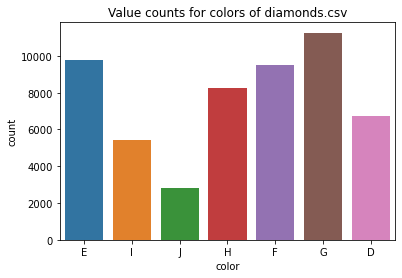

In [26]:
sns.countplot(x=df['color'])
plt.title('Value counts for colors of diamonds.csv')
plt.show()

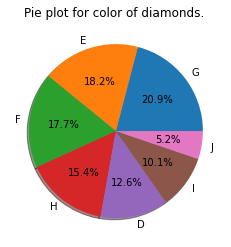

In [27]:
# pie chart for color colum
labels = df['color'].value_counts().index
plt.pie(df['color'].value_counts(),labels=labels, autopct='%1.1f%%', shadow=True)
plt.title('Pie plot for color of diamonds. ')
plt.show()

## 4. clarity

In [28]:
df['clarity'].value_counts()

SI1     13032
VS2     12229
SI2      9150
VS1      8156
VVS2     5056
VVS1     3647
IF       1784
I1        740
Name: clarity, dtype: int64

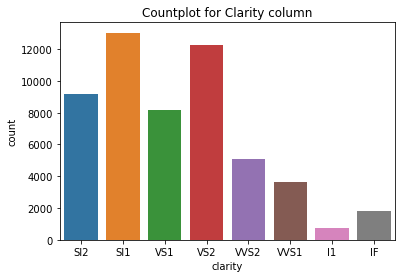

In [29]:
sns.countplot(x=df['clarity'])
plt.title('Countplot for Clarity column')
plt.show()

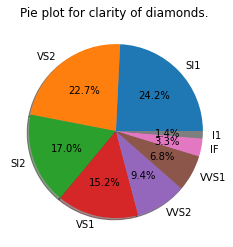

In [30]:
# pie chart for clarity colum
labels = df['clarity'].value_counts().index
plt.pie(df['clarity'].value_counts(),labels=labels, autopct='%1.1f%%', shadow=True)
plt.title('Pie plot for clarity of diamonds. ')
plt.show()

## 5. depth

In [31]:
df['depth'].describe()

count    53794.000000
mean        61.748080
std          1.429909
min         43.000000
25%         61.000000
50%         61.800000
75%         62.500000
max         79.000000
Name: depth, dtype: float64

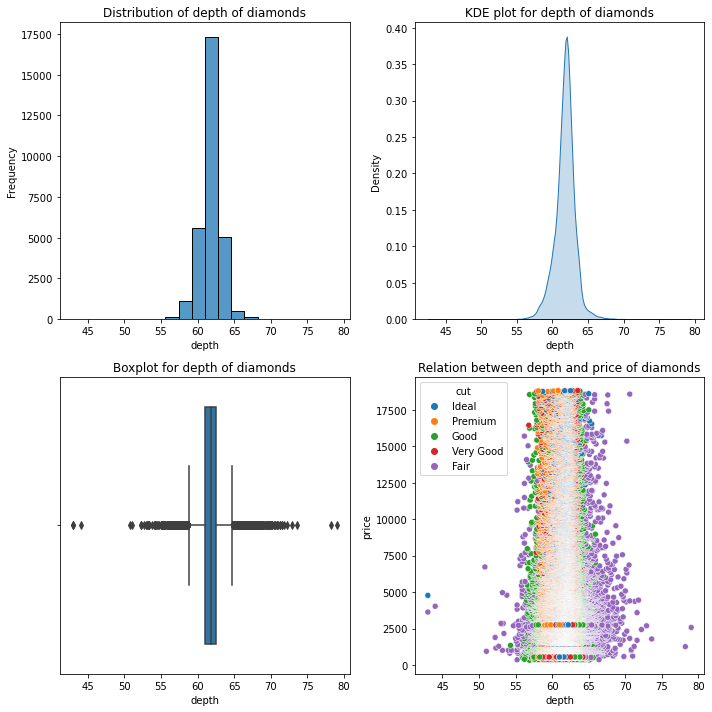

In [32]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

# Histogram
sns.histplot(x=df['depth'], bins=20, stat='frequency', ax=ax[0, 0])
ax[0, 0].set_title('Distribution of depth of diamonds')

# KDE plot
sns.kdeplot(x=df['depth'], fill=True, ax=ax[0, 1])
ax[0, 1].set_title('KDE plot for depth of diamonds')

# Boxplot
sns.boxplot(x=df['depth'], ax=ax[1, 0])
ax[1, 0].set_title('Boxplot for depth of diamonds')

# Relation with price column
sns.scatterplot(x=df['depth'], y=df['price'],hue=df['cut'], ax=ax[1, 1])
ax[1, 1].set_title('Relation between depth and price of diamonds')

plt.tight_layout()

plt.show()

In [33]:
# skewness for depth column
df['depth'].skew() 

-0.11425026120643586

- the skewness value of -0.11425026120643586 indicates a negative skew, it is close to zero. 
-  values closer to zero indicate a smaller degree of skewness.
- we will normalize it by using log transformation
- There are some outliers in column 'depth' we will remove them by IQR method

## 6.  table 

In [34]:
df['table'].describe()

count    53794.000000
mean        57.458109
std          2.233679
min         43.000000
25%         56.000000
50%         57.000000
75%         59.000000
max         95.000000
Name: table, dtype: float64

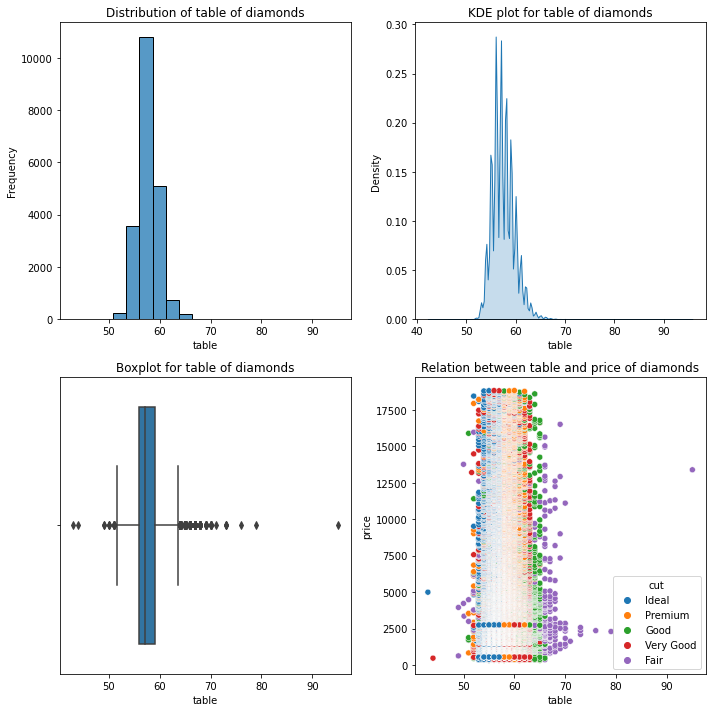

In [35]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

# Histogram
sns.histplot(x=df['table'], bins=20, stat='frequency', ax=ax[0, 0])
ax[0, 0].set_title('Distribution of table of diamonds')

# KDE plot
sns.kdeplot(x=df['table'], fill=True, ax=ax[0, 1])
ax[0, 1].set_title('KDE plot for table of diamonds')

# Boxplot
sns.boxplot(x=df['table'], ax=ax[1, 0])
ax[1, 0].set_title('Boxplot for table of diamonds')

# Relation with price column
sns.scatterplot(x=df['table'], y=df['price'],hue=df['cut'], ax=ax[1, 1])
ax[1, 1].set_title('Relation between table and price of diamonds')

plt.tight_layout()

plt.show()

In [36]:
df['table'].skew()

0.7922272870802959

- It shows right side skewed
- There are some outliers in table column , we will remove it by using IQR method

## 7. price --> target column

In [37]:
df['price'].describe()

count    53794.000000
mean      3933.065082
std       3988.114460
min        326.000000
25%        951.000000
50%       2401.000000
75%       5326.750000
max      18823.000000
Name: price, dtype: float64

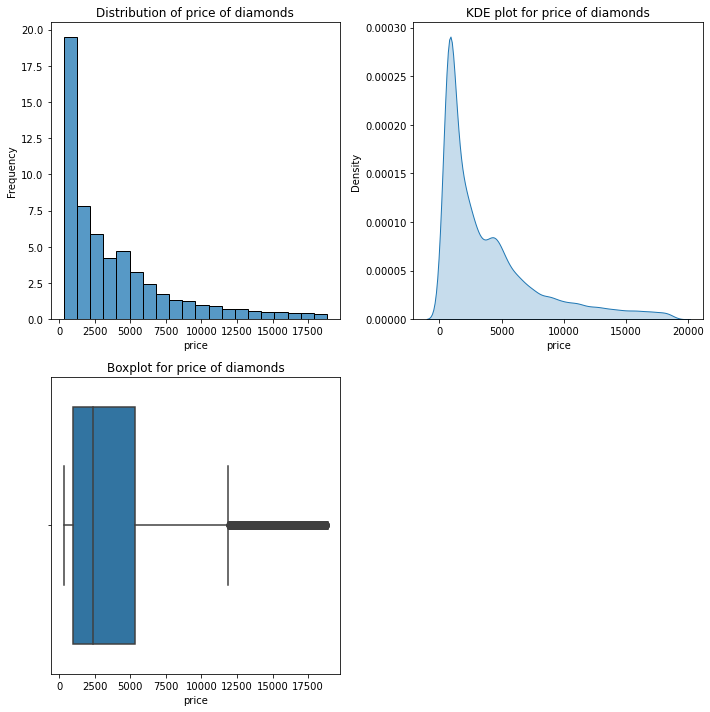

In [38]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

# Histogram
sns.histplot(x=df['price'], bins=20, stat='frequency', ax=ax[0, 0])
ax[0, 0].set_title('Distribution of price of diamonds')

# KDE plot
sns.kdeplot(x=df['price'], fill=True, ax=ax[0, 1])
ax[0, 1].set_title('KDE plot for price of diamonds')

# Boxplot
sns.boxplot(x=df['price'], ax=ax[1, 0])
ax[1, 0].set_title('Boxplot for price of diamonds')

ax[1, 1].axis('off')

plt.tight_layout()

plt.show()

In [39]:
df['price'].skew()

1.618239898265432

- It shows positive skewness in the price distribution in dataset.

## x , y z column

In [40]:
df[['x','y','z']].describe()

,x,y,z
count,53794.000000,53794.000000,53794.000000
mean,5.731214,5.734653,3.538714
std,1.120695,1.141209,0.705037
min,0.000000,0.000000,0.000000
25%,4.710000,4.720000,2.910000
50%,5.700000,5.710000,3.530000
75%,6.540000,6.540000,4.030000
max,10.740000,58.900000,31.800000


**** colum x ****


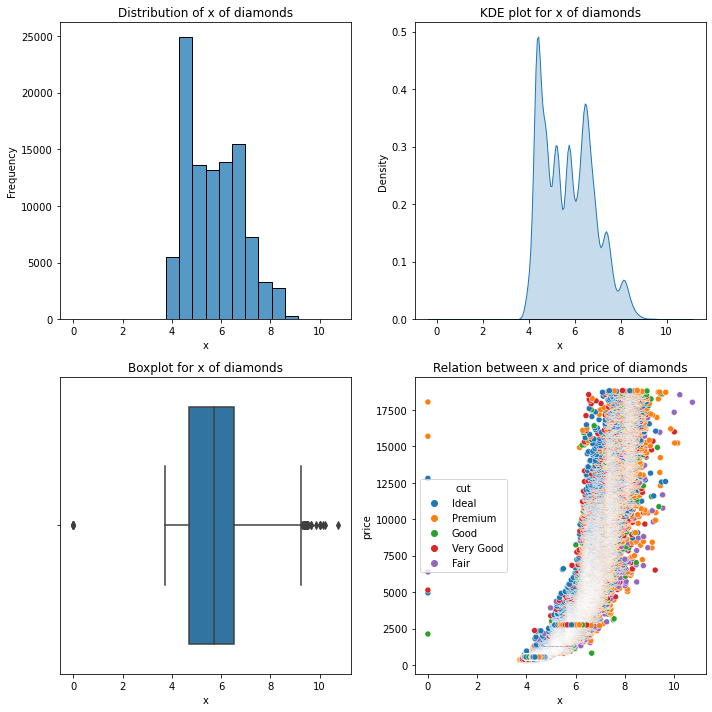


**** colum y ****


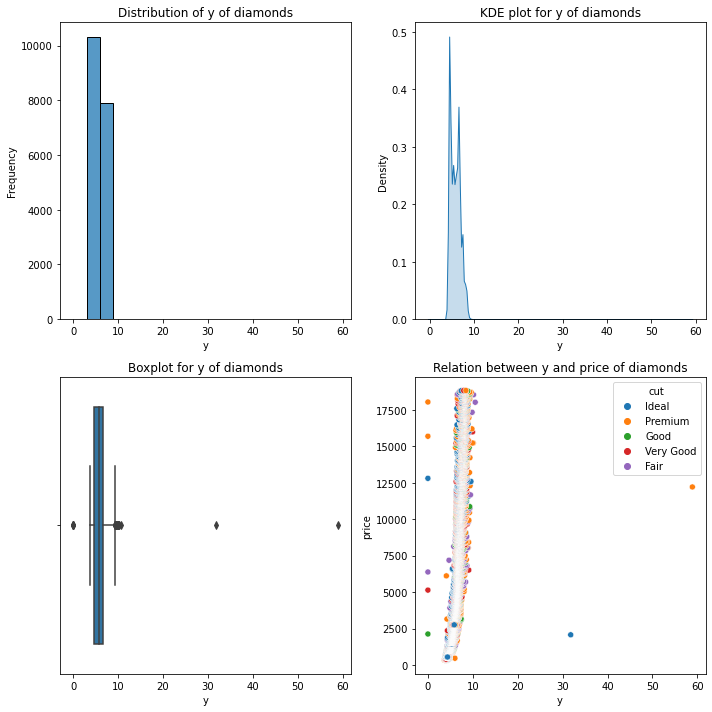


**** colum z ****


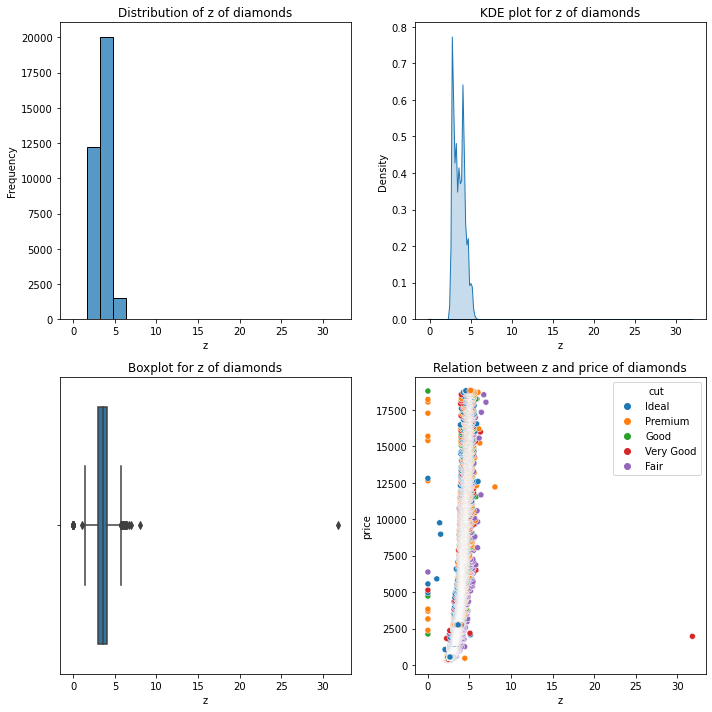

In [41]:
cols = ['x','y','z']
for i in cols:
    print(f'**** colum {i} ****')
    fig, ax = plt.subplots(2, 2, figsize=(10, 10))

    # Histogram
    sns.histplot(x=df[i], bins=20, stat='frequency', ax=ax[0, 0])
    ax[0, 0].set_title(f'Distribution of {i} of diamonds')

    # KDE plot
    sns.kdeplot(x=df[i], fill=True, ax=ax[0, 1])
    ax[0, 1].set_title(f'KDE plot for {i} of diamonds')

    # Boxplot
    sns.boxplot(x=df[i], ax=ax[1, 0])
    ax[1, 0].set_title(f'Boxplot for {i} of diamonds')

    # Relation with price column
    sns.scatterplot(x=df[i], y=df['price'],hue=df['cut'], ax=ax[1, 1])
    ax[1, 1].set_title(f'Relation between {i} and price of diamonds')

    plt.tight_layout()

    plt.show()
    print()

In [42]:
cols = ['x','y','z']
for i in cols:
    skewness = df[i].skew()
    print(f'skewness for i is : ', skewness)
    if skewness>0:
        print(f"distribution of {i} is positively(right side) skewed")
    elif skewness<0:
        print(f"distribution of {i} is negatively(left side) skewed")
    else:
        print(f"distribution of {i} is normalized skewed")
    print()   
        

skewness for i is :  0.37962390611337177
distribution of x is positively(right side) skewed

skewness for i is :  2.4457680214087554
distribution of y is positively(right side) skewed

skewness for i is :  1.5290234285039366
distribution of z is positively(right side) skewed



# 3. Bivariate analysis

### 1. numerical - numerical columns

#### A. carat vs price

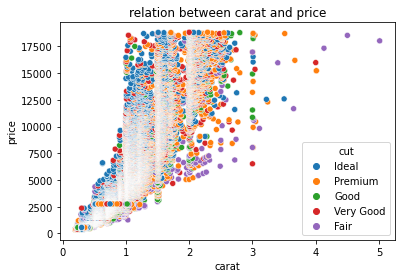

In [43]:
sns.scatterplot(x=df['carat'], y= df['price'], hue=df['cut'])
plt.title('relation between carat and price')
plt.show()

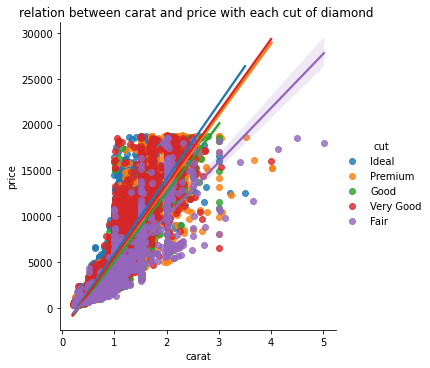

In [44]:
sns.lmplot(data=df, x='carat', y= 'price', hue='cut')
plt.title('relation between carat and price with each cut of diamond ')
plt.show()

In [45]:
fig = px.scatter(df, x='carat', y='price', color='cut',
                 trendline='ols',
                title='Relation between carat and price')
fig.show()


#### 2. cut and price column

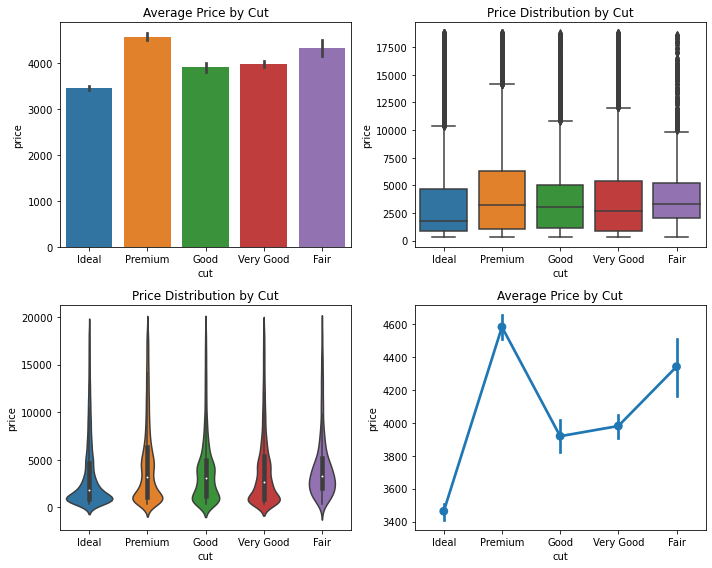

In [46]:
fig, ax = plt.subplots(2, 2, figsize=(10, 8))

# Bar Plot
sns.barplot(x='cut', y='price', data=df, ax=ax[0, 0])
ax[0, 0].set_title('Average Price by Cut')

# Box Plot
sns.boxplot(x='cut', y='price', data=df, ax=ax[0, 1])
ax[0, 1].set_title('Price Distribution by Cut')

# Violin Plot
sns.violinplot(x='cut', y='price', data=df, ax=ax[1, 0])
ax[1, 0].set_title('Price Distribution by Cut')

# Point Plot
sns.pointplot(x='cut', y='price', data=df, ax=ax[1, 1])
ax[1, 1].set_title('Average Price by Cut')

plt.tight_layout()
plt.show()

- Ideal diamonds are having lowest average price 
- Fair diamonds are having highest average price that

#### 3. color vs price bivariate analuyis

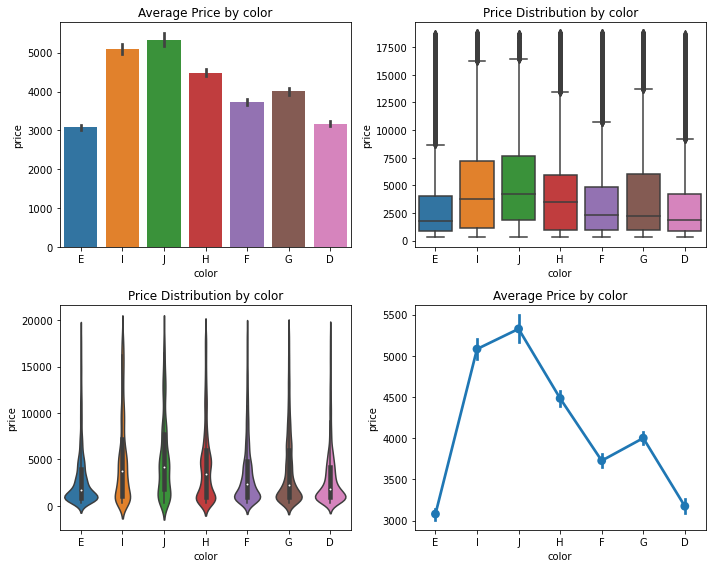

In [47]:
fig, ax = plt.subplots(2, 2, figsize=(10, 8))

# Bar Plot
sns.barplot(x='color', y='price', data=df, ax=ax[0, 0])
ax[0, 0].set_title('Average Price by color')

# Box Plot
sns.boxplot(x='color', y='price', data=df, ax=ax[0, 1])
ax[0, 1].set_title('Price Distribution by color')

# Violin Plot
sns.violinplot(x='color', y='price', data=df, ax=ax[1, 0])
ax[1, 0].set_title('Price Distribution by color')

# Point Plot
sns.pointplot(x='color', y='price', data=df, ax=ax[1, 1])
ax[1, 1].set_title('Average Price by color')

plt.tight_layout()
plt.show()

- J color diamonds having highest average price.


#### 4. clarity vs price of diamond

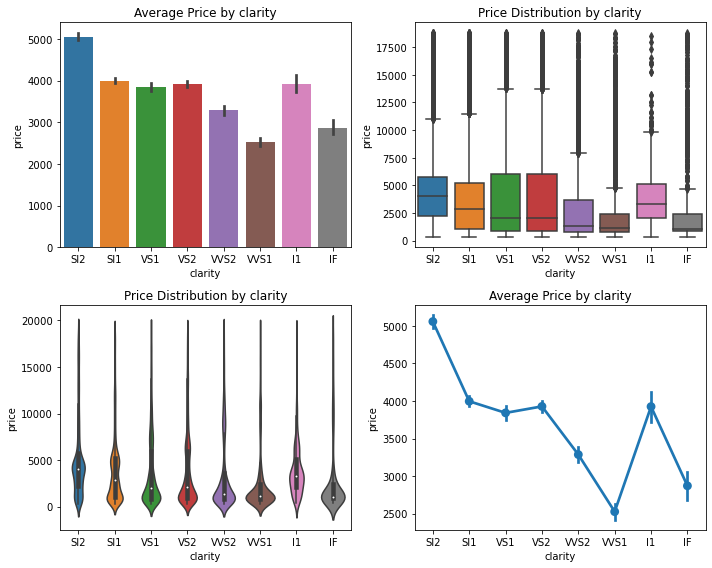

In [48]:
fig, ax = plt.subplots(2, 2, figsize=(10, 8))

# Bar Plot
sns.barplot(x='clarity', y='price', data=df, ax=ax[0, 0])
ax[0, 0].set_title('Average Price by clarity')

# Box Plot
sns.boxplot(x='clarity', y='price', data=df, ax=ax[0, 1])
ax[0, 1].set_title('Price Distribution by clarity')

# Violin Plot
sns.violinplot(x='clarity', y='price', data=df, ax=ax[1, 0])
ax[1, 0].set_title('Price Distribution by clarity')

# Point Plot
sns.pointplot(x='clarity', y='price', data=df, ax=ax[1, 1])
ax[1, 1].set_title('Average Price by clarity')

plt.tight_layout()
plt.show()

- Highest average price of diamond , if clarity of diamond is  SI2.
- lowest average price of diamonds, when  clarities of diamonds are   WS1 and IF.

#### 5. depth vs price distribution

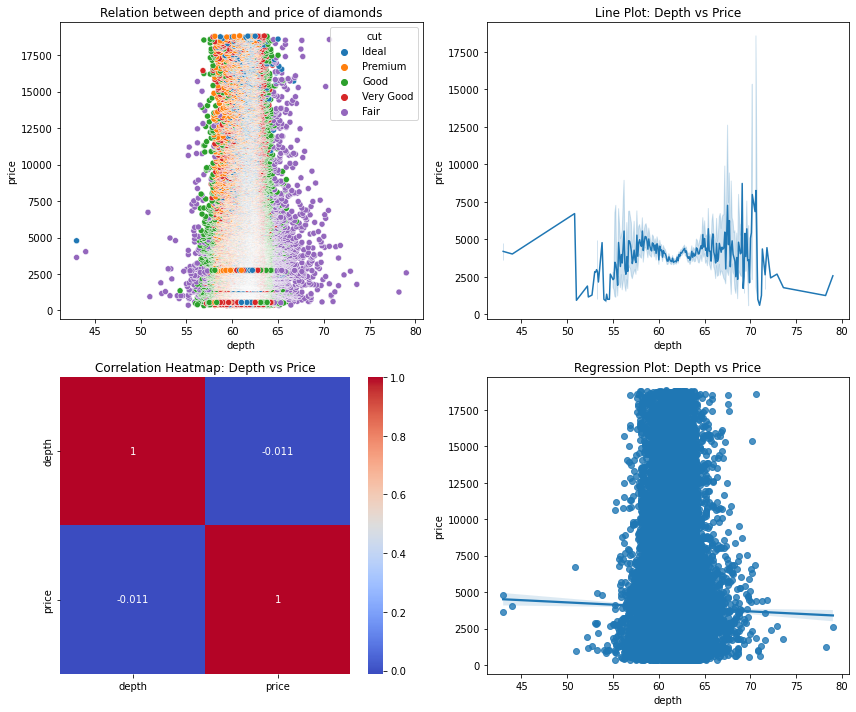

In [49]:
fig, ax = plt.subplots(2, 2, figsize=(12, 10))

# Scatter Plot
sns.scatterplot(x=df['depth'], y=df['price'],hue=df['cut'], ax=ax[0, 0])
ax[0,0].set_title('Relation between depth and price of diamonds')

# Line Plot
sns.lineplot( x=df['depth'], y=df['price'], ax=ax[0, 1])
ax[0, 1].set_title('Line Plot: Depth vs Price')

# Heatmap
heatmap_data = df[['depth', 'price']].corr()
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', ax=ax[1, 0])
ax[1, 0].set_title('Correlation Heatmap: Depth vs Price')

# Regression Plot
sns.regplot(x=df['depth'], y=df['price'], ax=ax[1, 1])
ax[1, 1].set_title('Regression Plot: Depth vs Price')


plt.tight_layout()
plt.show()


#### 6. table vs price distribution

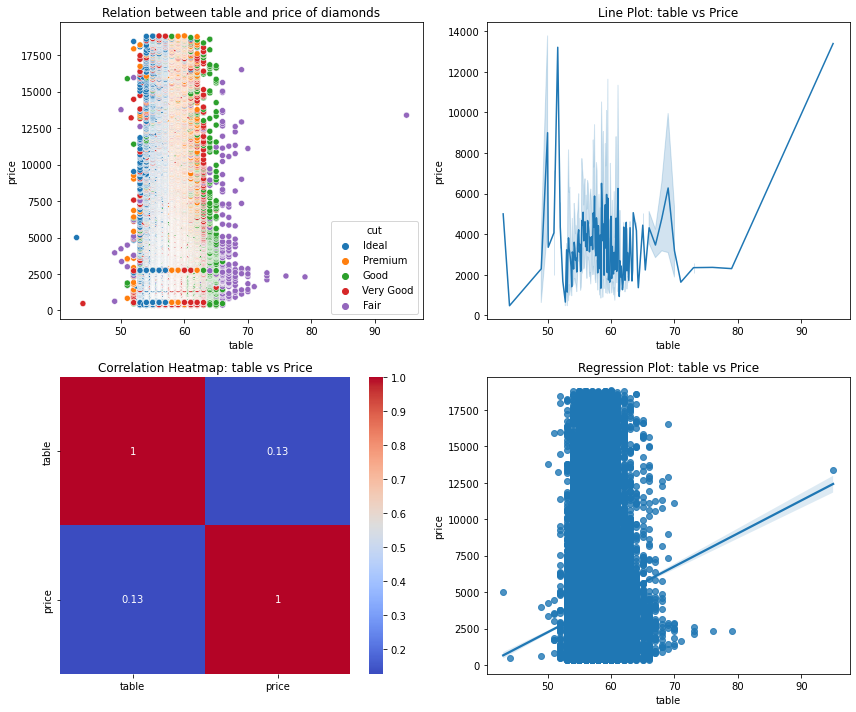

In [50]:
fig, ax = plt.subplots(2, 2, figsize=(12, 10))

# Scatter Plot
sns.scatterplot(x=df['table'], y=df['price'],hue=df['cut'], ax=ax[0, 0])
ax[0,0].set_title('Relation between table and price of diamonds')

# Line Plot
sns.lineplot( x=df['table'], y=df['price'], ax=ax[0, 1])
ax[0, 1].set_title('Line Plot: table vs Price')

# Heatmap
heatmap_data = df[['table', 'price']].corr()
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', ax=ax[1, 0])
ax[1, 0].set_title('Correlation Heatmap: table vs Price')

# Regression Plot
sns.regplot(x=df['table'], y=df['price'], ax=ax[1, 1])
ax[1, 1].set_title('Regression Plot: table vs Price')


plt.tight_layout()
plt.show()


### 7. column x vs price 

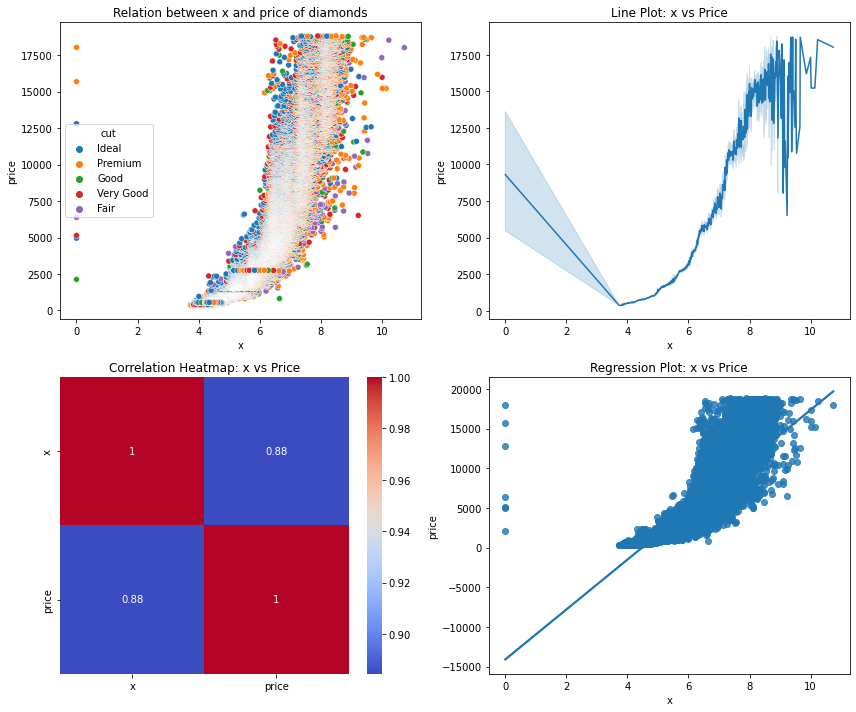

In [51]:
fig, ax = plt.subplots(2, 2, figsize=(12, 10))

# Scatter Plot
sns.scatterplot(x=df['x'], y=df['price'],hue=df['cut'], ax=ax[0, 0])
ax[0,0].set_title('Relation between x and price of diamonds')

# Line Plot
sns.lineplot( x=df['x'], y=df['price'], ax=ax[0, 1])
ax[0, 1].set_title('Line Plot: x vs Price')

# Heatmap
heatmap_data = df[['x', 'price']].corr()
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', ax=ax[1, 0])
ax[1, 0].set_title('Correlation Heatmap: x vs Price')

# Regression Plot
sns.regplot(x=df['x'], y=df['price'], ax=ax[1, 1])
ax[1, 1].set_title('Regression Plot: x vs Price')


plt.tight_layout()
plt.show()


#### 8. column y vs price

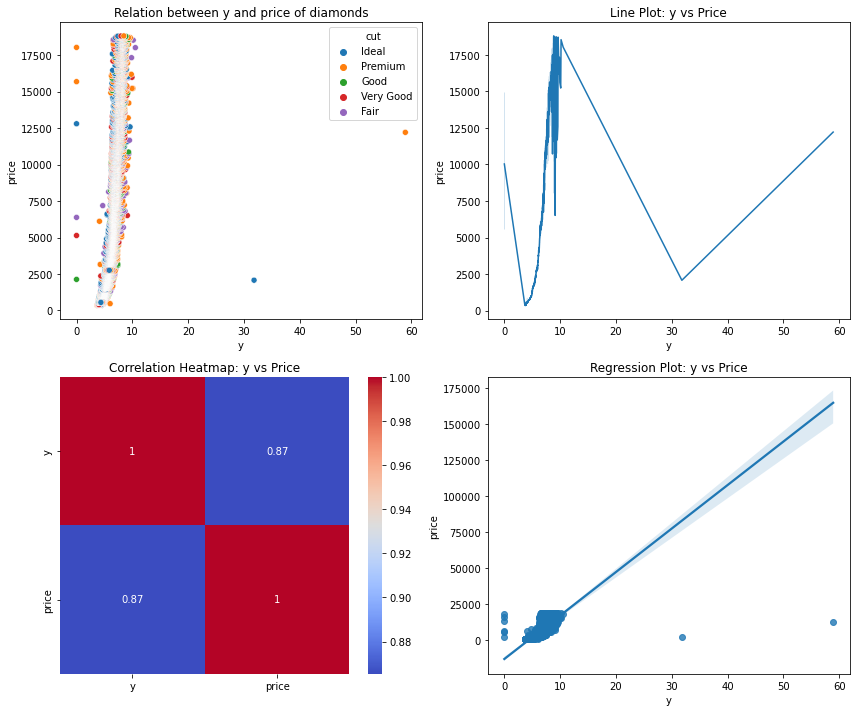

In [52]:
fig, ax = plt.subplots(2, 2, figsize=(12, 10))

# Scatter Plot
sns.scatterplot(x=df['y'], y=df['price'],hue=df['cut'], ax=ax[0, 0])
ax[0,0].set_title('Relation between y and price of diamonds')

# Line Plot
sns.lineplot( x=df['y'], y=df['price'], ax=ax[0, 1])
ax[0, 1].set_title('Line Plot: y vs Price')

# Heatmap
heatmap_data = df[['y', 'price']].corr()
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', ax=ax[1, 0])
ax[1, 0].set_title('Correlation Heatmap: y vs Price')

# Regression Plot
sns.regplot(x=df['y'], y=df['price'], ax=ax[1, 1])
ax[1, 1].set_title('Regression Plot: y vs Price')


plt.tight_layout()
plt.show()


#### 9. z vs price 

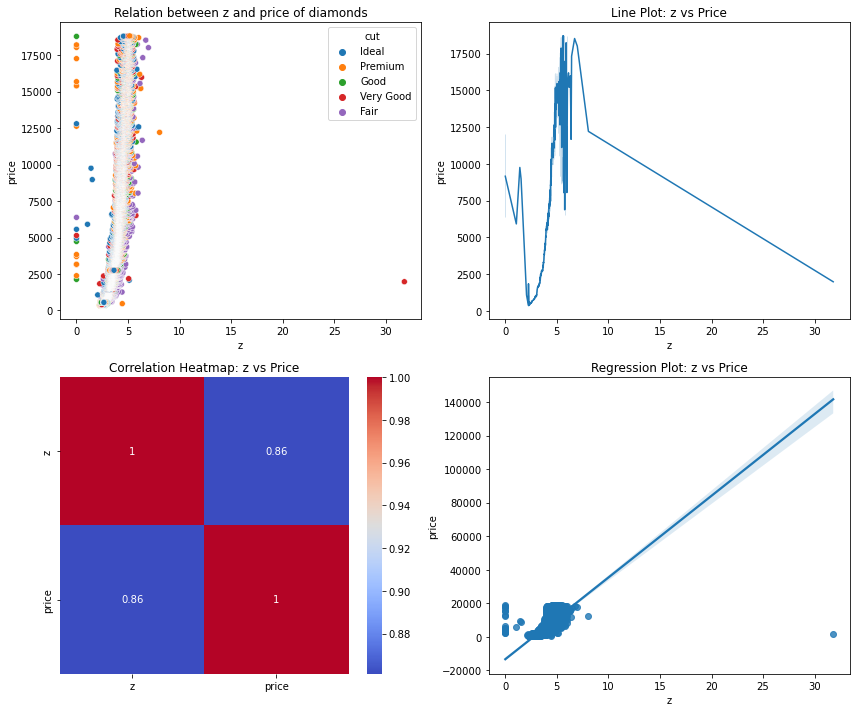

In [53]:
fig, ax = plt.subplots(2, 2, figsize=(12, 10))

# Scatter Plot
sns.scatterplot(x=df['z'], y=df['price'],hue=df['cut'], ax=ax[0, 0])
ax[0,0].set_title('Relation between z and price of diamonds')

# Line Plot
sns.lineplot( x=df['z'], y=df['price'], ax=ax[0, 1])
ax[0, 1].set_title('Line Plot: z vs Price')

# Heatmap
heatmap_data = df[['z', 'price']].corr()
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', ax=ax[1, 0])
ax[1, 0].set_title('Correlation Heatmap: z vs Price')

# Regression Plot
sns.regplot(x=df['z'], y=df['price'], ax=ax[1, 1])
ax[1, 1].set_title('Regression Plot: z vs Price')


plt.tight_layout()
plt.show()


### Removing outliers

In [54]:
# make fuction for remove outlier
def remove_outlier(data, column):
    #  quartiles and IQR for the specified column
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    
    # lower and upper bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Remove outliers outside the bounds for the specified column
    data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
    
    return data

In [55]:
num_cols

Index(['carat', 'depth', 'table', 'price', 'x', 'y', 'z'], dtype='object')

In [56]:
# removing outliers
for column in num_cols:
    df = remove_outlier(df, column)

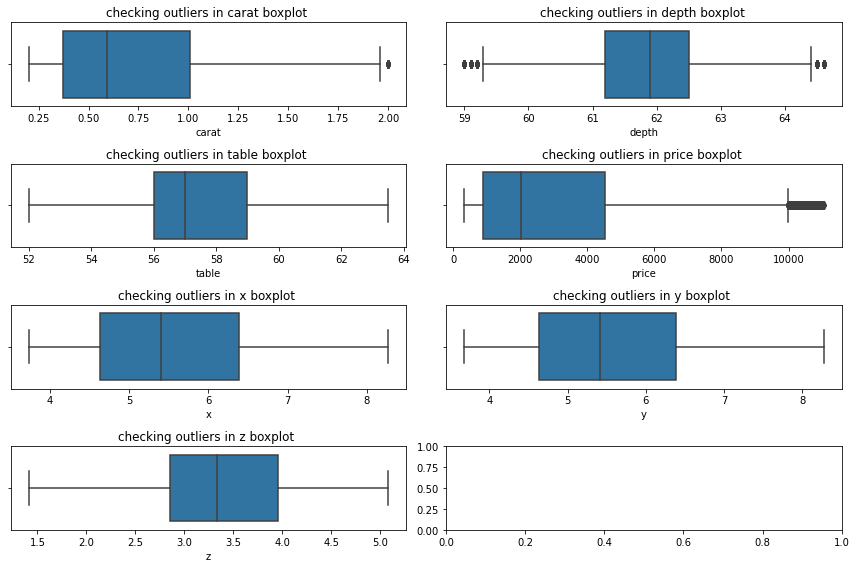

In [88]:
# chech outliers removal is done or not on boxplot

fig, ax = plt.subplots( 4,2, figsize=(12, 8))

# Flatten the axes array for easier iteration
ax = ax.flatten()

for i, column in enumerate(num_cols):
    sns.boxplot(x=df[column], ax=ax[i])  # Plot the boxplot
    ax[i].set_title(f"checking outliers in {column} boxplot ")  # Set the title for the subplot
    


fig.tight_layout()

plt.show()

In [58]:
# checking above 10000 price 
df[df['price']>10000].shape

(886, 10)

In [59]:
df.shape

(46425, 10)

In [60]:
df.describe()

,carat,depth,table,price,x,y,z
count,46425.000000,46425.000000,46425.000000,46425.000000,46425.000000,46425.000000,46425.000000
mean,0.698218,61.803673,57.239968,3001.342768,5.522105,5.527182,3.414310
std,0.361951,1.077656,2.013965,2599.798006,0.964303,0.958496,0.597123
min,0.200000,59.000000,52.000000,326.000000,3.730000,3.680000,1.410000
25%,0.370000,61.200000,56.000000,881.000000,4.630000,4.630000,2.850000
50%,0.590000,61.900000,57.000000,2007.000000,5.400000,5.410000,3.330000
75%,1.010000,62.500000,59.000000,4524.000000,6.390000,6.390000,3.960000
max,2.000000,64.600000,63.500000,11047.000000,8.270000,8.270000,5.080000


# 3. Multivariate analysis

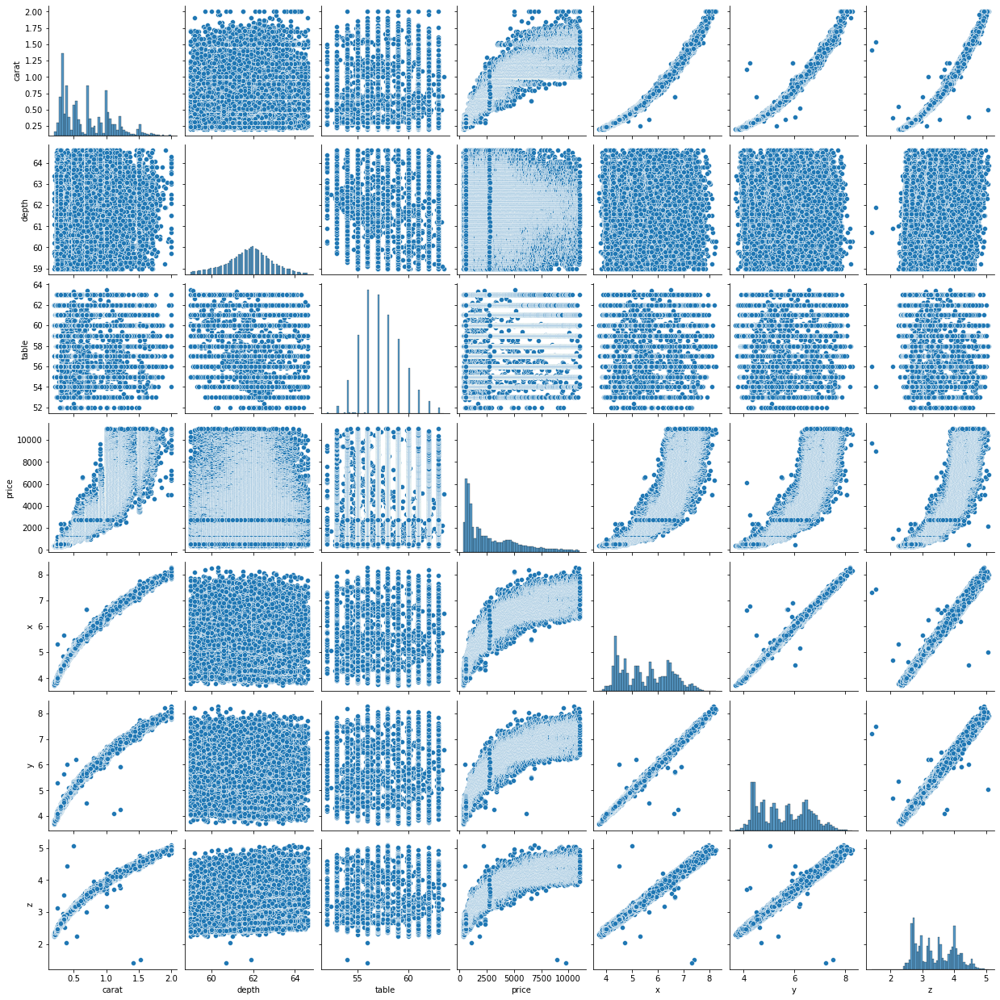

In [61]:
### pairplot
sns.pairplot(df)

In [62]:
# correlation
df.corr() 

,carat,depth,table,price,x,y,z
carat,1.000000,0.043941,0.189035,0.924808,0.986615,0.985740,0.985464
depth,0.043941,1.000000,-0.227804,0.014309,-0.002400,-0.004224,0.098980
table,0.189035,-0.227804,1.000000,0.140052,0.186698,0.181178,0.160916
price,0.924808,0.014309,0.140052,1.000000,0.904003,0.905046,0.900865
x,0.986615,-0.002400,0.186698,0.904003,1.000000,0.998494,0.993492
y,0.985740,-0.004224,0.181178,0.905046,0.998494,1.000000,0.993299
z,0.985464,0.098980,0.160916,0.900865,0.993492,0.993299,1.000000


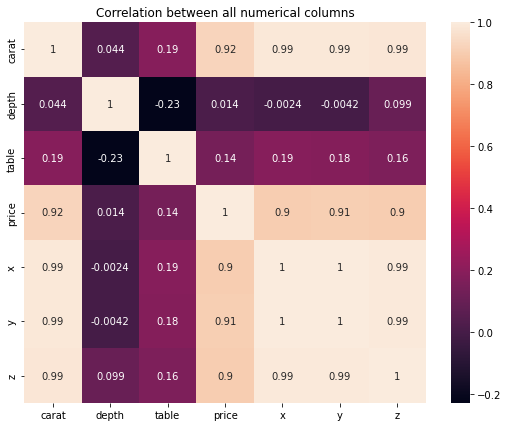

In [63]:
# heatmap
plt.figure(figsize=(9,7))
sns.heatmap(df.corr(), annot=True)
plt.title('Correlation between all numerical columns')
plt.show()

In [64]:
df.isnull().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64

In [65]:
df.duplicated().sum()

0

# split data as dependent and independent columns

In [66]:
X = df.drop('price', axis=1)
y = df['price']

In [67]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.25)

print('Shape of X_train: ',X_train.shape)
print('Shape of X_test: ',X_test.shape)
print('Shape of y_train: ',y_train.shape)
print('Shape of y_test: ',y_test.shape)

Shape of X_train:  (34818, 9)
Shape of X_test:  (11607, 9)
Shape of y_train:  (34818,)
Shape of y_test:  (11607,)


In [90]:
X_train.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'x', 'y', 'z'], dtype='object')

## Encoding categorical columns
### 1. Ordinal encoding for column cut

In [68]:
df['cut'].unique()

array(['Ideal', 'Premium', 'Good', 'Very Good', 'Fair'], dtype=object)

In [69]:
df['cut'] = df['cut'].astype('category')
df['cut'].unique()

['Ideal', 'Premium', 'Good', 'Very Good', 'Fair']
Categories (5, object): ['Fair', 'Good', 'Ideal', 'Premium', 'Very Good']

In [70]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder(categories=[['Fair', 'Good', 'Ideal', 'Premium', 'Very Good']])
encoder.fit(X_train[['cut']])

X_train['cut']=encoder.transform(X_train[['cut']])
X_test['cut'] = encoder.transform(X_test[['cut']])

X_train['cut'].unique()

C:\Users\Anand\AppData\Local\Temp/ipykernel_21220/2426785517.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Anand\AppData\Local\Temp/ipykernel_21220/2426785517.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



array([2., 3., 4., 1., 0.])

### 2. One Hot encoder for column ['color','clarity']

In [71]:
from sklearn.preprocessing import OneHotEncoder

ohe_cols = ['color','clarity']

ohe = OneHotEncoder(drop='first')

# fit X_train in onehotencoder
ohe.fit(X_train[ohe_cols])

# x_train transformed by ohe and stored in array
ohe_train = ohe.transform(X_train[ohe_cols]).toarray()

# x_test transform by ohe and stored in an array
ohe_test = ohe.transform(X_test[ohe_cols]).toarray()

# encoded column names 
encoded_column = ohe.get_feature_names(ohe_cols)

# x_train dataframme
X_train_ohe = pd.DataFrame(ohe_train, columns=encoded_column)

# X_test dataframe for only categorical data
X_test_ohe = pd.DataFrame(ohe_test, columns=encoded_column)


# concat all columns encoded and numericals

In [72]:
## X_train_encode

# reset index categorical columns after encoding
aa = X_train_ohe.reset_index(drop=True) 

# reset index numerical columns
bb = X_train[X_train.drop(ohe_cols, axis=1).columns].reset_index(drop=True) 

# complete X_train
X_train_encoded = pd.concat([aa, bb],axis=1)

X_train_encoded.shape

(34818, 20)

In [73]:
## X_test_encode

# reset index categorical columns after encoding
aa = X_test_ohe.reset_index(drop=True) 

# reset index numerical columns
bb = X_test[X_test.drop(ohe_cols, axis=1).columns].reset_index(drop=True) 

# complete X_test
X_test_encoded = pd.concat([aa, bb],axis=1)

X_test_encoded.shape

(11607, 20)

In [74]:
X_train_encoded.head()

,color_E,color_F,color_G,color_H,color_I,color_J,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2,carat,cut,depth,table,x,y,z
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.52,2.0,61.0,55.0,5.19,5.23,3.18
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.25,3.0,60.7,59.0,4.11,4.13,2.50
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.70,3.0,60.0,60.0,5.69,5.65,3.51
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.59,4.0,62.9,58.0,5.31,5.34,3.35
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.42,2.0,62.6,55.0,4.77,4.78,2.99


# scaling data

In [75]:
X_train_encoded.columns

Index(['color_E', 'color_F', 'color_G', 'color_H', 'color_I', 'color_J',
       'clarity_IF', 'clarity_SI1', 'clarity_SI2', 'clarity_VS1',
       'clarity_VS2', 'clarity_VVS1', 'clarity_VVS2', 'carat', 'cut', 'depth',
       'table', 'x', 'y', 'z'],
      dtype='object')

In [76]:

numerical_cols = ['carat','cut','depth','table', 'x', 'y', 'z']

## 1. Standard scaler

In [77]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()


sc.fit(X_train_encoded)

X_train_sc = sc.fit_transform(X_train_encoded)
X_train_st = pd.DataFrame(X_train_sc, columns=X_train_encoded.columns)

X_test_sc = sc.transform(X_test_encoded)
X_test_st = pd.DataFrame(X_test_sc, columns=X_test_encoded.columns)

## 2. MinMax scaler

In [78]:
from sklearn.preprocessing import MinMaxScaler
mm = MinMaxScaler()
mm.fit(X_train_encoded)

X_train_mm = mm.transform(X_train_encoded)
X_train_mm = pd.DataFrame(X_train_mm, columns=X_train_encoded.columns)

X_test_mm = mm.transform(X_test_encoded)
X_test_mm = pd.DataFrame(X_test_mm, columns=X_test_encoded.columns)

## 3. robust scaler

In [79]:
from sklearn.preprocessing import RobustScaler
rbst = RobustScaler()

rbst.fit(X_train_encoded)

X_train_rbst = rbst.transform(X_train_encoded)
X_train_rbst = pd.DataFrame(X_train_rbst, columns=X_train_encoded.columns)

X_test_rbst = rbst.transform(X_test_encoded)
X_test_rbst = pd.DataFrame(X_test_rbst, columns=X_test_encoded.columns)

# Machine Learning Algorithms

In [80]:
# testing result
from sklearn.metrics import r2_score, mean_absolute_error

# 1) Linear Regression

### A. LinEAR REgression on standard scaled data

In [81]:
from sklearn.linear_model import LinearRegression
lrsc = LinearRegression()

lrsc.fit(X_train_st, y_train)
y_sc_pred = lrsc.predict(X_test_st)
print("r2 score for std data : ", r2_score(y_test, y_sc_pred))
print("mean absolute error for standard scaled data : ", mean_absolute_error(y_test, y_sc_pred))

r2 score for std data :  0.9240368616471115
mean absolute error for standard scaled data :  485.7148985427359


### B. LinEAR REgression on minmax scaled data

In [82]:
lrmm = LinearRegression()
lrmm.fit(X_train_mm, y_train)

y_mm_pred = lrmm.predict(X_test_mm)

print("r2 score for minmax sclaed data : ", r2_score(y_test, y_mm_pred))
print("mean absolute error for minmax scaled data : ", mean_absolute_error(y_test, y_mm_pred))

r2 score for minmax sclaed data :  0.9240368616471115
mean absolute error for minmax scaled data :  485.7148985427359


### C. Linear regressoion on robust scaled data

In [83]:
lr_rbst = LinearRegression()
lr_rbst.fit(X_train_rbst, y_train)

y_rbst_pred = lr_rbst.predict(X_test_rbst)

print("r2 score for robust sclaed data : ", r2_score(y_test, y_rbst_pred))
print("mean absolute error for robust scaled data : ", mean_absolute_error(y_test, y_rbst_pred))

r2 score for robust sclaed data :  0.9240368616471115
mean absolute error for robust scaled data :  485.71489854273636


# 2. Support vector Regressor

In [84]:
from sklearn.svm import SVR

### A.  svm with Standard scaled data¶

### B. svm with MinMax scaled data

### C. svm with Robust scaled data

# 3. K Neighbors regressor

### A. knregressor with standard scaled data

In [85]:
from sklearn.neighbors import KNeighborsRegressor
for i in range(1,20,2):
    knr_sc = KNeighborsRegressor(n_neighbors=i)
    knr_sc.fit(X_train_st, y_train)
    y_knrsc_pred = knr_sc.predict(X_test_st)
    r2scr = r2_score(y_test, y_knrsc_pred)
    mae = mean_absolute_error(y_test, y_knrsc_pred)
    print(f"when K = {i}, then r2_score: {r2scr}, mae: {mae}")
    

when K = 1, then r2_score: 0.9534618881629395, mae: 319.0297234427501
when K = 3, then r2_score: 0.9655004203611303, mae: 284.4117630165705
when K = 5, then r2_score: 0.9663875689752257, mae: 281.2522615662962
when K = 7, then r2_score: 0.9660093489641917, mae: 283.3527920343635
when K = 9, then r2_score: 0.9649016758664052, mae: 286.5743468979447
when K = 11, then r2_score: 0.9639948314753337, mae: 290.0477219859489
when K = 13, then r2_score: 0.9626224784854146, mae: 294.16130186691055
when K = 15, then r2_score: 0.961848886638999, mae: 297.78779472157606
when K = 17, then r2_score: 0.9607880956920051, mae: 301.45180139773663
when K = 19, then r2_score: 0.9593045047414722, mae: 306.2842839847098


### B. kn regressor with min max scaled data

In [86]:
from sklearn.neighbors import KNeighborsRegressor
for i in range(1,20,2):
    knr_mm = KNeighborsRegressor(n_neighbors=i)
    knr_mm.fit(X_train_mm, y_train)
    y_knrmm_pred = knr_mm.predict(X_test_mm)
    r2scr_mm = r2_score(y_test, y_knrmm_pred)
    mae_mm = mean_absolute_error(y_test, y_knrmm_pred)
    print(f"when K = {i}, then r2_score: {r2scr_mm}, mae: {mae_mm}")

when K = 1, then r2_score: 0.9550436844801069, mae: 313.55147755664683
when K = 3, then r2_score: 0.9656566736261857, mae: 281.82562246919963
when K = 5, then r2_score: 0.966603534986599, mae: 278.8436116136814
when K = 7, then r2_score: 0.9660540184856838, mae: 281.6540388189393
when K = 9, then r2_score: 0.9648100159309794, mae: 284.78152072982783
when K = 11, then r2_score: 0.9633320686171566, mae: 290.3576290169725
when K = 13, then r2_score: 0.961750810103247, mae: 294.68006706828106
when K = 15, then r2_score: 0.9606993404251715, mae: 298.02116538870223
when K = 17, then r2_score: 0.9591438991327366, mae: 302.6205383161277
when K = 19, then r2_score: 0.9572574505478485, mae: 307.74187536559157


## C. kn regressor with Robust scaled data

In [91]:
from sklearn.neighbors import KNeighborsRegressor
for i in range(1,20,2):
    knr_rbst = KNeighborsRegressor(n_neighbors=i)
    knr_rbst.fit(X_train_rbst, y_train)
    y_knrrbst_pred = knr_rbst.predict(X_test_rbst)
    r2scr_rbst = r2_score(y_test, y_knrrbst_pred)
    mae_rbst = mean_absolute_error(y_test, y_knrrbst_pred)
    print(f"when K = {i}, then r2_score: {r2scr_rbst}, mae: {mae_rbst}")

when K = 1, then r2_score: 0.9409993018669659, mae: 349.82450245541486
when K = 3, then r2_score: 0.9554749274809771, mae: 317.8413313804888
when K = 5, then r2_score: 0.9546419276383492, mae: 321.16341862669077
when K = 7, then r2_score: 0.9531651511115684, mae: 326.31590542652833
when K = 9, then r2_score: 0.9513446435994143, mae: 333.21845055187
when K = 11, then r2_score: 0.9489766470711793, mae: 340.01040124689644
when K = 13, then r2_score: 0.9468438994786023, mae: 345.6231253023706
when K = 15, then r2_score: 0.9447153833990269, mae: 352.99233795697995
when K = 17, then r2_score: 0.9421499424525885, mae: 361.4839625175477
when K = 19, then r2_score: 0.9397926598921086, mae: 369.1528478731074


# 4. Decision Tree Regressor

In [92]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

## A. decision tree regressor with standard scaled data.

In [96]:
dtt_st = DecisionTreeRegressor()

dtt_st.fit(X_train_st, y_train)
pred = dtt_st.predict(X_test_st)
print(r2_score(y_test, pred))
print(mean_absolute_error(y_test, pred))
print(mean_squared_error(y_test, pred))



0.9571804897363861
270.9063065391574
287164.38711553375


## B. decision tree regressor with min max scaled data

In [98]:
# decision tree regressor with min max scaled data
dtt_mm = DecisionTreeRegressor()

dtt_mm.fit(X_train_mm, y_train)
pred = dtt_mm.predict(X_test_mm)
print(r2_score(y_test, pred))
print(mean_absolute_error(y_test, pred))
print(mean_squared_error(y_test, pred))



0.9573412347865552
269.885930903765
286086.3679245283


## C. decision tree regressor with robust scaled data

In [99]:
# decision tree regressor with robust scaled data
dtt_rbst = DecisionTreeRegressor()

dtt_rbst.fit(X_train_rbst, y_train)
pred = dtt_rbst.predict(X_test_rbst)
print(r2_score(y_test, pred))
print(mean_absolute_error(y_test, pred))
print(mean_squared_error(y_test, pred))


0.9569348539734017
272.4136297062118
288811.7166365124


# 5. Random forest regressor

In [100]:
from sklearn.ensemble import RandomForestRegressor

## A. Random Forest REgressor with standard scaled data

In [101]:
rfr_st = RandomForestRegressor()

rfr_st.fit(X_train_st, y_train)
rfr_st_pred = rfr_st.predict(X_test_st)
print("r2 score for standard sclaed data : ", r2_score(y_test, rfr_st_pred))
print("mean absolute error for standard scaled data : ", mean_absolute_error(y_test,rfr_st_pred)) 

r2 score for standard sclaed data :  0.9772809754960246
mean absolute error for standard scaled data :  206.48816771693603


## B. Random Forest REgressor with minmax scaled data

In [103]:
rfr_mm = RandomForestRegressor()

rfr_mm.fit(X_train_mm, y_train)
rfr_mm_pred = rfr_mm.predict(X_test_mm)
print("r2 score for minmax sclaed data : ", r2_score(y_test, rfr_mm_pred))
print("mean absolute error for minmax scaled data : ", mean_absolute_error(y_test,rfr_mm_pred)) 

r2 score for minmax sclaed data :  0.9772395513138044
mean absolute error for minmax scaled data :  206.5313280922432


## C. Random Forest REgressor with robust scaled data

In [104]:
rfr_rbst = RandomForestRegressor()

rfr_rbst.fit(X_train_rbst, y_train)
rfr_rbst_pred = rfr_rbst.predict(X_test_rbst)
print("r2 score for robust sclaed data : ", r2_score(y_test, rfr_rbst_pred))
print("mean absolute error for robust scaled data : ", mean_absolute_error(y_test,rfr_rbst_pred)) 

r2 score for robust sclaed data :  0.9770650760768546
mean absolute error for robust scaled data :  206.78452648135155


## We have applied 5 machine learning algorithms on 3 types of scaled data.
### We have got good accuracy in 'Random Forest Regressor' model on 'Standard Scaled Data' , we put it in pickle file to further process

In [105]:
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
5,0.24,Very Good,J,VVS2,62.8,57.0,336,3.94,3.96,2.48


In [106]:
X_train_st.head()

,color_E,color_F,color_G,color_H,color_I,color_J,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2,carat,cut,depth,table,x,y,z
0,-0.481092,-0.467234,-0.516616,2.379056,-0.320317,-0.223607,-0.190232,-0.567157,2.334815,-0.430082,-0.546264,-0.281412,-0.329180,-0.493591,-0.662281,-0.743896,-1.111361,-0.345614,-0.311399,-0.393345
1,2.078605,-0.467234,-0.516616,-0.420335,-0.320317,-0.223607,-0.190232,-0.567157,-0.428299,2.325136,-0.546264,-0.281412,-0.329180,-1.237875,0.397965,-1.022208,0.873831,-1.463127,-1.456605,-1.529912
2,-0.481092,-0.467234,1.935673,-0.420335,-0.320317,-0.223607,-0.190232,-0.567157,2.334815,-0.430082,-0.546264,-0.281412,-0.329180,0.002598,0.397965,-1.671601,1.370129,0.171754,0.125862,0.158224
3,2.078605,-0.467234,-0.516616,-0.420335,-0.320317,-0.223607,-0.190232,1.763180,-0.428299,-0.430082,-0.546264,-0.281412,-0.329180,-0.300629,1.458211,1.018744,0.377533,-0.221445,-0.196878,-0.109204
4,-0.481092,-0.467234,1.935673,-0.420335,-0.320317,-0.223607,-0.190232,-0.567157,-0.428299,-0.430082,-0.546264,-0.281412,3.037854,-0.769252,-0.662281,0.740432,-1.111361,-0.780202,-0.779892,-0.710915


 - order of column input in app is [color, clarity, carat, cut,depth, table,x,y,z]
 - target column is 'price'

In [108]:
# store cleaned data in new file
df.to_csv('diamonds_cleaned_data.csv')